# Benchmarking Interpolation:
### Inverse Great Circle Distance vs. Spherical Spline Interpolation
#### Code for Great Circle Distance

In [1]:
import numpy as np
import pandas as pd
from math import radians, cos, sin, asin, sqrt
def haversine(rad, lon1, lat1, lon2, lat2):
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    return c * rad

def gc(coords, i, j, r):
    t = coords[i][0]
    t_ = coords[j][0]
    p = coords[i][1]
    p_ = coords[j][1]
    args = {'rad' : r, 'lon1' : t,
      'lat1' : p, 'lon2' : t_, 'lat2': p_}
    return haversine(**args)

def gc_invdist_interp(data, bad_electrodes, coords, r, numpts = 5):
    closest = []
    for ind in bad_electrodes:
        gcord = coords[ind]
        t, p = gcord
        ds = np.zeros([coords.shape[0]])
        for c in range(coords.shape[0]):
            if c in bad_electrodes:
                ds[c] = float('Inf')
            else:
                ds[c] = haversine(r, t, coords[c][0],
                                  p, coords[c][1])
        inds = np.argsort(ds)[1: numpts + 1]
        w = 1 / ds[inds]
        weighted = np.multiply(data[:, inds], w)
        predicted = np.sum(weighted, axis = 1) / sum(w)
        data[:, ind] = predicted
        closest.append(inds)
    return data

#### Code for Spherical Splines

In [2]:
def intp(D, coords, rm_idx, s=1000):
    old = D[rm_idx, :]
    samp_idx = np.setdiff1d(np.arange(D.shape[0]), rm_idx)
    sample = D[samp_idx]
    F = []
    for i in range(sample.shape[1]):
        F_i = ssi(sample[:, i],
                  coords[samp_idx],
                  s = s)
        F.append(F_i)
    pred = []
    for idx in rm_idx:
        itp = []
        for i, f in enumerate(F):
            if f is None:
                itp.append(D[idx, i])
            else:
                itp.append(f(coords[idx, 0],
                          coords[idx, 1])[0][0])
        pred.append(np.array(itp))
    D[rm_idx] = np.array(pred)
    return D


from scipy.interpolate import SmoothSphereBivariateSpline
def ssi(E, P, s):
    try:
        F = SmoothSphereBivariateSpline(P[:, 0], P[:, 1],
                                    E, s=s)
    except:
        F = None
    return F

#### Code for Discriminibility

In [3]:
from py_disc.disc import D

#### Load data

In [4]:
import h5py
import numpy as np
import pandas as pd
import cufflinks as cf
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import (download_plotlyjs,
                            init_notebook_mode,
                            plot,
                            iplot)
def plot_heat(M, title):
    data = [
        go.Heatmap(
            z = M
        )
    ]
    layout = go.Layout(
        title = title
    )
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)
    
data = h5py.File('test1.mat', 'r')
eeg_data1 = np.array(data['result']['data'])
base = data['result']['chanlocs']
x1 = [base[e[0]][:][0][0] for e in base['X']] 
y1 = [base[e[0]][:][0][0] for e in base['Y']]
z1 = [base[e[0]][:][0][0] for e in base['Z']] 
t1 = np.array([base[e[0]][:][0][0] for e in base['sph_theta']]) + 180
p1 = np.array([base[e[0]][:][0][0] for e in base['sph_phi']]) + 90
r1 = np.array([base[e[0]][:][0][0] for e in base['sph_radius']])
data = go.Scatter3d(
        x=x1,
        y=y1,
        z=z1,
        mode='markers',
        marker = dict(size=3)
        
    )
layout = go.Layout(
    title='EEG Channel Positions on Head Cap, Subject 1'
)
fig = go.Figure(data=[data], layout=layout)
iplot(fig, filename='simple-3d-scatter')
plot_heat(eeg_data1.T[:, ::100], 'Subject 1, microVoltage of Channels over time')

In [5]:
data = h5py.File('test2.mat', 'r')
eeg_data2 = np.array(data['result']['data'])
base = data['result']['chanlocs']
x2 = [base[e[0]][:][0][0] for e in base['X']] 
y2 = [base[e[0]][:][0][0] for e in base['Y']]
z2 = [base[e[0]][:][0][0] for e in base['Z']]
t2 = np.array([base[e[0]][:][0][0] for e in base['sph_theta']]) + 180
p2 = np.array([base[e[0]][:][0][0] for e in base['sph_phi']]) + 90
r2 = np.array([base[e[0]][:][0][0] for e in base['sph_radius']])
data = go.Scatter3d(
        x=x2,
        y=y2,
        z=z2,
        mode='markers',
        marker = dict(size=3)
        
    )
layout = go.Layout(
    title='EEG Channel Positions on Head Cap, Subject 2'
)
fig = go.Figure(data=[data], layout=layout)
iplot(fig, filename='simple-3d-scatter')
plot_heat(eeg_data2.T[:, ::100], 'Subject 2, microVoltage of Channels over time')

In [6]:
plot_heat((eeg_data1.T[:, :3000] - eeg_data2.T[:, :3000]),
          'Subject 1 - Subject 2, microVoltage of Channels over time, first 3000 timesteps')

#### Put coordinates in radians instead of degrees

In [7]:
coords_1 = np.array([t1, p1]).T
coords_1[:, 0] = (coords_1[:, 1] + 180) / 180.
coords_1[:, 1] = (coords_1[:, 0] + 180) / 180.
coords_2 = np.array([t2, p2]).T
coords_2[:, 0] = (coords_2[:, 1] + 180) / 180.
coords_2[:, 1] = (coords_2[:, 0] + 180) / 180.

#### Explore different metrics
Here we explore how discriminibility behaves with respect to two different metrics, on the raw data. This will give us a baseline for performance.

In [316]:
results = []
for num in range(10, 111, 10):
    print num
    rand_idx = np.random.choice(np.arange(111),
                                    num,
                                    replace=False)
    egd1 = eeg_data1.copy()
    noise1 = np.random.normal(100, 1000, rand_idx.shape[0] * egd1.shape[0])
    noise1 = noise1.reshape(egd1.shape[0], rand_idx.shape[0])
    egd1[:, rand_idx] += noise1
    egd2 = eeg_data2.copy()
    noise2 = np.random.normal(100, 1000, rand_idx.shape[0] * egd2.shape[0])
    noise2 = noise2.reshape(egd2.shape[0], rand_idx.shape[0])
    egd2[:, rand_idx] += noise2
    ds1 = [egd1.T[:, i:i+5000] for i in range(0, egd1.T.shape[1], 20000)][:-1]
    #print 'Data set 1 is', len(ds1), 'trials of shape', ds1[0].shape
    ds2 = [egd2.T[:, i:i+5000] for i in range(0, egd2.T.shape[1], 20000)][:-1]
    #print 'Data set 2 is', len(ds2), 'trials of shape', ds2[0].shape
    DS = np.array(ds1 + ds2)
    labels = np.array(['A'] * len(ds1) + ['B'] * len(ds2))
    ra = np.array(map(lambda x: np.nan_to_num(np.corrcoef(x)), DS))
    results.append(D(ra, labels, fn)[0])

10
20
30
40
50
60
70
80
90
100
110


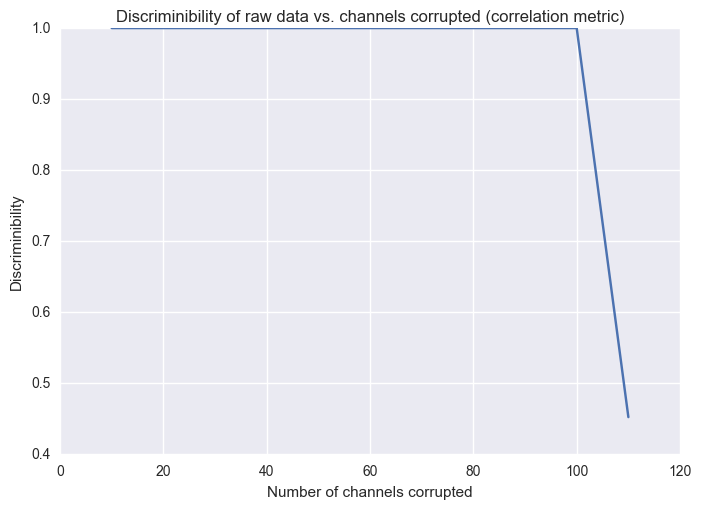

In [318]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("darkgrid")
plt.plot(range(10, 111, 10), results)
plt.title("Discriminibility of raw data vs. channels corrupted (correlation metric)")
plt.xlabel("Number of channels corrupted")
plt.ylabel("Discriminibility")
plt.show()

In [320]:
def coherence(currd):
    coherearr = []
    for i in range (0, len(currd)):
        temparr = []
        for j in range (0, len(currd)):
            temparr.append(np.mean(
                coh(currd[i], currd[j], 500)[1]
            ))
    coherearr.append(temparr)
    return np.array(coherearr)
def fn(x, y):
    d = np.linalg.norm(x - y)
    return d

In [312]:
results2 = []
for num in range(10, 111, 10):
    print num
    rand_idx = np.random.choice(np.arange(111),
                                    num,
                                    replace=False)
    egd1 = eeg_data1.copy()
    noise1 = np.random.normal(100, 1000, rand_idx.shape[0] * egd1.shape[0])
    noise1 = noise1.reshape(egd1.shape[0], rand_idx.shape[0])
    egd1[:, rand_idx] += noise1
    egd2 = eeg_data2.copy()
    noise2 = np.random.normal(100, 1000, rand_idx.shape[0] * egd2.shape[0])
    noise2 = noise2.reshape(egd2.shape[0], rand_idx.shape[0])
    egd2[:, rand_idx] += noise2
    ds1 = [egd1.T[:, i:i+5000] for i in range(0, egd1.T.shape[1], 20000)][:-1]
    #print 'Data set 1 is', len(ds1), 'trials of shape', ds1[0].shape
    ds2 = [egd2.T[:, i:i+5000] for i in range(0, egd2.T.shape[1], 20000)][:-1]
    #print 'Data set 2 is', len(ds2), 'trials of shape', ds2[0].shape
    DS = np.array(ds1 + ds2)
    labels = np.array(['A'] * len(ds1) + ['B'] * len(ds2))
    ra = np.array(map(lambda x: np.nan_to_num(coherence(x)), DS))
    results2.append(D(ra, labels, fn)[0])

10
20
30
40
50
60
70
80
90
100
110


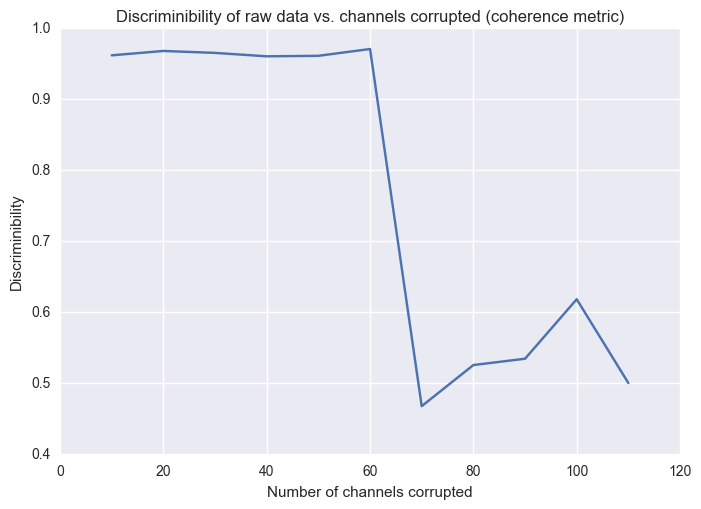

In [319]:
sns.set_style("darkgrid")
plt.plot(range(10, 111, 10), results2)
plt.title("Discriminibility of raw data vs. channels corrupted (coherence metric)")
plt.xlabel("Number of channels corrupted")
plt.ylabel("Discriminibility")
plt.show()

#### Discussion of these two plots
Based on these two plots, it appears that the coherence metric would be better for measuring discriminibility. This is because correlation is already extremely high, so maximizing it would be meaningless since it is already maximal.

#### Measure discriminibility for Spherical Splines
We will corrupt 60 electrodes and then interpolate those 60 electrodes here. This is because according to the plot above 50 appears to be a bifurcation point, and it may be that interpolation pushes it to the .9 discriminibility side rather than the .5 discriminibility side.

In [323]:
rand_idx = np.random.choice(np.arange(111),
                                    50,
                                    replace=False)
egd1 = eeg_data1.copy()
noise1 = np.random.normal(100, 1000, rand_idx.shape[0] * egd1.shape[0])
noise1 = noise1.reshape(egd1.shape[0], rand_idx.shape[0])
egd1[:, rand_idx] += noise1
egd2 = eeg_data2.copy()
noise2 = np.random.normal(100, 1000, rand_idx.shape[0] * egd2.shape[0])
noise2 = noise2.reshape(egd2.shape[0], rand_idx.shape[0])
egd2[:, rand_idx] += noise2
ds1 = [egd1.T[:, i:i+5000] for i in range(0, egd1.T.shape[1], 20000)][:-1]
#print 'Data set 1 is', len(ds1), 'trials of shape', ds1[0].shape
ds2 = [egd2.T[:, i:i+5000] for i in range(0, egd2.T.shape[1], 20000)][:-1]
#print 'Data set 2 is', len(ds2), 'trials of shape', ds2[0].shape
DS = np.array(ds1 + ds2)
labels = np.array(['A'] * len(ds1) + ['B'] * len(ds2))


In [330]:
coords = {'A': coords_1, 'B': coords_2}
raw_discs = []
intp_discs = []
s_vals = np.arange(50000, 400000, 50000)
ra = np.array(map(lambda x: np.nan_to_num(coherence(x)), DS))
raw_discs = len(s_vals) * [D(ra, labels, fn)[0]]
for s_val in s_vals:
    print s_val
    #s_val = 100000
    ds = DS.copy()
    for i, d in enumerate(ds):
        ds[i] = intp(d, coords[labels[i]], rand_idx, s = s_val)
    ra = np.array(map(lambda x: np.nan_to_num(coherence(x)), ds))
    intp_discs.append(D(ra, labels, fn)[0])

50000
100000
150000
200000
250000
300000
350000


[0.46558219178082189, 0.46558219178082189, 0.46558219178082189, 0.46558219178082189, 0.46558219178082189, 0.46558219178082189, 0.46558219178082189]
[0.93065068493150682, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


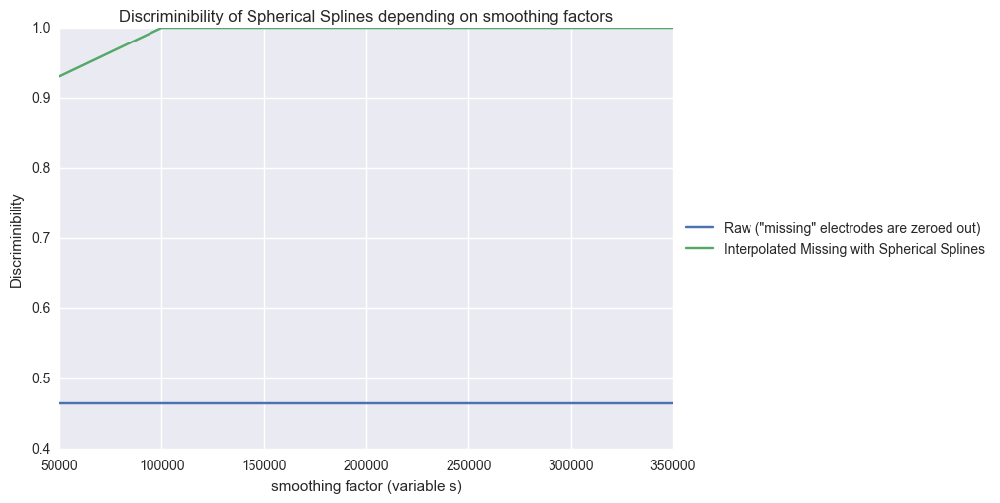

In [333]:
import seaborn as sns
import matplotlib.pyplot as plt
print raw_discs
print intp_discs
sns.set_style("darkgrid")
plt.plot(s_vals, raw_discs, label = 'Raw ("missing" electrodes are zeroed out)')
plt.plot(s_vals, intp_discs, label = 'Interpolated Missing with Spherical Splines')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("Discriminibility of Spherical Splines depending on smoothing factors")
plt.xlabel("smoothing factor (variable s)")
plt.ylabel("Discriminibility")
plt.show()

#### Measure discriminibility for inverse distance weighting

In [334]:
#gc_invdist_interp(data, bad_electrodes, coords, r, numpts = 5)
coords = {'A': coords_1, 'B': coords_2}
raw_discs2 = []
intp_discs2 = []
ra2 = np.array(map(lambda x: np.nan_to_num(coherence(x)), DS))
raw_discs2 = len(s_vals) * [D(ra, labels, fn)[0]]
n_intps = np.arange(2, 20, 2)
for nintp in n_intps:
    ds = DS.copy()
    for i, d in enumerate(ds):
        res = gc_invdist_interp(d.T, rand_idx, coords[labels[i]], 1, nintp).T
        ds[i] = res
    ra = np.array(map(lambda x: np.nan_to_num(coherence(x)), ds))
    disc = D(ds, labels, fn)[0]
    intp_discs2.append(disc)

KeyboardInterrupt: 

In [336]:
print raw_discs
print intp_discs2

[0.46558219178082189, 0.46558219178082189, 0.46558219178082189, 0.46558219178082189, 0.46558219178082189, 0.46558219178082189, 0.46558219178082189]
[0.6404109589041096, 0.6371575342465754, 0.63647260273972606, 0.63339041095890403, 0.63202054794520557, 0.63253424657534241]


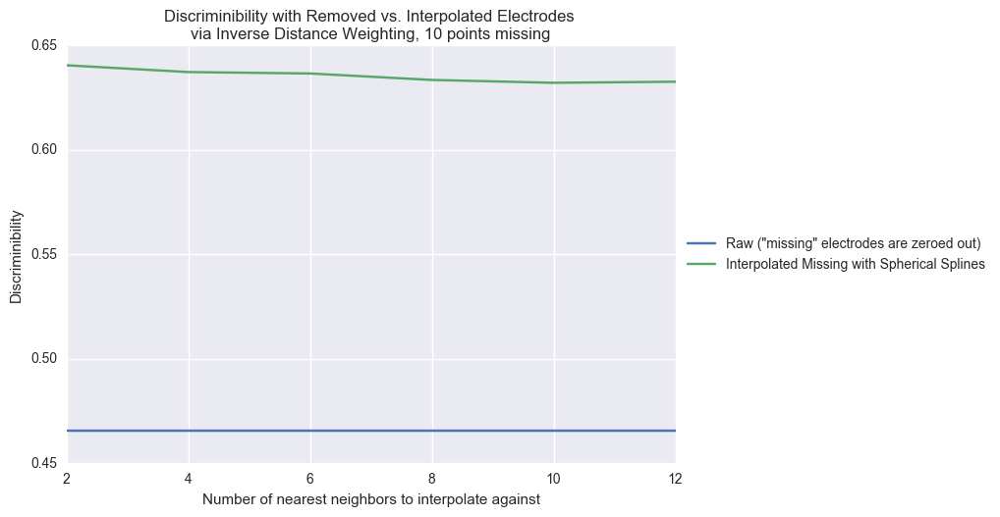

In [339]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("darkgrid")
plt.plot(n_intps[:6], raw_discs[:6], label = 'Raw ("missing" electrodes are zeroed out)')
plt.plot(n_intps[:6], intp_discs2[:6], label = 'Interpolated Missing with Spherical Splines')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title(
"""Discriminibility with Removed vs. Interpolated Electrodes 
via Inverse Distance Weighting, 10 points missing""")
plt.xlabel("Number of nearest neighbors to interpolate against")
plt.ylabel("Discriminibility")
plt.show()

### Comparison of raw, ssi, igcd

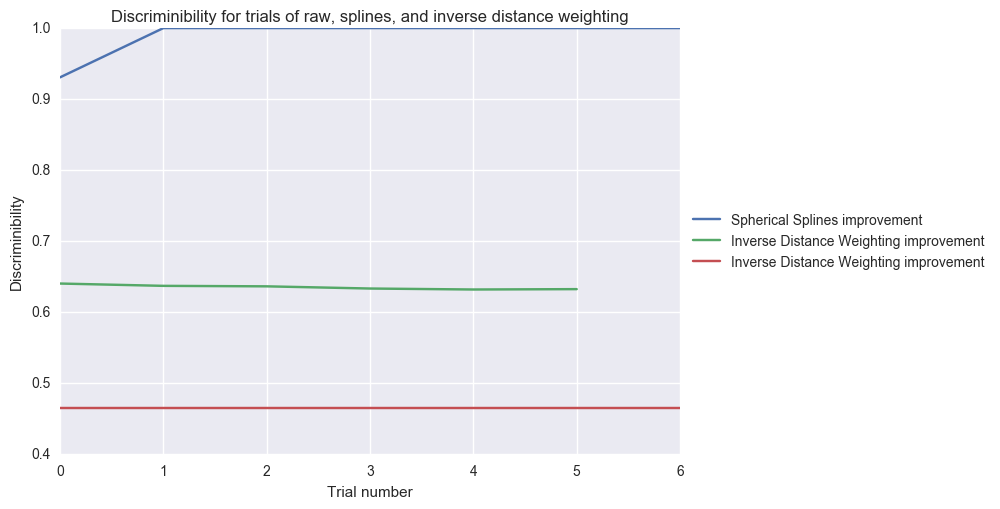

In [343]:
plt.plot(np.arange(len(intp_discs)), intp_discs, label = 'Spherical Splines improvement')
plt.plot(np.arange(len(intp_discs2)), intp_discs2, label = 'Inverse Distance Weighting improvement')
plt.plot(np.arange(len(raw_discs)), raw_discs, label = 'Inverse Distance Weighting improvement')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title(
"""Discriminibility for trials of raw, splines, and inverse distance weighting""")
plt.xlabel("Trial number")
plt.ylabel("Discriminibility")
plt.show()